# Sear for Bad spectra and Bad tracking effect

- look for which parameter allow to identify a bad spectrum

 work with Weakly_2023_11
- use jupyter kernel LSST
- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2023/03/05
- last update : 2023/04/07

- Spectractor https://github.com/lsst/Spectractor/
- Spectractor Version 2.4
- branch lsst-dev
- available in version w_2023_11 by default


In [1]:
! eups list -s | grep LOCAL

atmospec              LOCAL:/home/d/dagoret/repos/repos_w_2023_11/atmospec 	setup
eups                  LOCAL:/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-5.1.0/eups 	setup


In [2]:
! eups list -s lsst_distrib

   gdf42428520+c82c1836b5 	current w_2023_11 setup


In [3]:
import h5py

In [4]:
import lsst.daf.butler as dafButler
#import lsst.summit.utils.butlerUtils as butlerUtils

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.ticker as tck
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
import pandas as pd
plt.rcParams.update({'figure.max_open_warning': 0})

import matplotlib.ticker                         # here's where the formatter is
import os
import re
import pandas as pd

plt.rcParams["figure.figsize"] = (4,3)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'

In [6]:
import pickle

In [7]:
from astropy.time import Time
import astropy.units as u

## Config

In [8]:
FLAG_MOUNT_ERRORS= True

### Butler

In [9]:
#repo =  "/sdf/group/rubin/repo/main"
#repo = "/sdf/group/rubin/repo/oga/"
repo = "/repo/embargo/"
butler = dafButler.Butler(repo)
registry = butler.registry

### Date & Filter & Disperser & collection

- make your choice

In [10]:
DateToRuncollection = {

 # september 2022
 20220912 :  "u/dagoret/BPS_manyspectro_v60", # Missing collection
 20220913 :  "u/dagoret/BPS_manyspectro_v61", # Missing collection
 20220914 :  "u/dagoret/BPS_manyspectro_v62", # Missing collection  
    
 20220927 :  "u/dagoret/BPS_manyspectro_v63", # Mount errors available, mitigé
 20220928 :  "u/dagoret/BPS_manyspectro_v64", # Mount errors available, very nice spectra
 20220929 :  "u/dagoret/BPS_manyspectro_v65", # Mount errors available, very nice spectra
    
    
 # october 2022
 20221012 :  "u/dagoret/BPS_manyspectro_v56", # mount errors , nice, all good
 20221025 :  "u/dagoret/BPS_manyspectro_v57", # mount errors, very very bad spectra, must remove run
 20221026 :  "u/dagoret/BPS_manyspectro_v58", # mount errors,  nice spectra, all good
 20221027 :  "u/dagoret/BPS_manyspectro_v59", # mount errors,  nice spectra, all good
    
 # november 2022
 20221109 :  "u/dagoret/BPS_manyspectro_v53", # mount errors, nice spectra, few bad labelled as good 
 20221110 :  "u/dagoret/BPS_manyspectro_v54", # mount errors available, many bad rec spectra, few bad labelled as good, versy strange
 20221123 :  "u/dagoret/BPS_manyspectro_v55", # mount errors , nice   
    
 # december 2022   
 20221207 :  "u/dagoret/BPS_manyspectro_v48", # No mount error, nice spectra
 20221208 :  "u/dagoret/BPS_manyspectro_v49", # No mount error, nice spectra, one bad labelled as good
 20221209 :  "u/dagoret/BPS_manyspectro_v50", # No mount error, spectra at distance from optical center, very interesting
 20221210 :  "u/dagoret/BPS_manyspectro_v51", # No mount error, bof
 20221212 :  "u/dagoret/BPS_manyspectro_v52", # No mount error, very bad gains and instability    
    
 #January 2023 
 20230117 :  "u/dagoret/BPS_manyspectro_v79", # no mount errors, some mucol spectra that looks good are rejected on DCCD
 20230118 :  "u/dagoret/BPS_manyspectro_v80", # no mount error, some mucol looking good are rejected, many bad centroid calculation
 20230119 :  "u/dagoret/BPS_manyspectro_v77", # no mount errors, many blurred spectra probably due to strong tracking error
 20230131 :  "u/dagoret/BPS_manyspectro_v78", # missing for moment

 #february 2023
 20230214 :  "u/dagoret/BPS_manyspectro_v42", # no mount errors, nothing special
 20230215 :  "u/dagoret/BPS_manyspectro_v43", # mount errors, OK
 20230216 :  "u/dagoret/BPS_manyspectro_v44", # mount errors, OK, nice spectra 
 20230228 :  "u/dagoret/BPS_manyspectro_v70", # No mount error,OK nice spectra
    
 #march 2023  
 20230301 :  "u/dagoret/BPS_manyspectro_v71", # no mount errors, OK many spectra
 20230302 :  "u/dagoret/BPS_manyspectro_v72", # no mount error, sometime bas subtraction of order2 on HD38666 (mucol) 
 20230315 :  "u/dagoret/BPS_manyspectro_v73", # mount errors
 20230316 :  "u/dagoret/BPS_manyspectro_v74", # mount errors   
    
}

In [11]:
DATE = 20230316
my_collection = DateToRuncollection[DATE]

filterdispersername = "empty~holo4_003"

RUNSELECTION = 20230330
#RUNSELECTION = 20230403

## Selection criteria

In [12]:
chi2_fit_max = 25
chi2_fit_min = 0

d2ccd_max = 189
d2ccd_min = 186.6

pixshift_max = 0.3
pixshift_min = -0.3

xtarget_min = 50
xtarget_max = 250

ytarget_min = 700
ytarget_max = 1000

In [13]:
def SelectionCriteria(row):
    """
    Calculate the Spectrum selection flag on pandas dataframe
    
    call it on a dataframe df as
    
    flag_selection = df[["spec_header_d2ccd","spec_header_targetx","spec_header_targety"]].apply(SelectionCriteria,axis=1)
    """
    

    d2ccd = row["spec_header_d2ccd"]
    xtarget = row["spec_header_targetx"]
    ytarget = row["spec_header_targety"]
    
    flag_selection_d2ccd = (d2ccd > d2ccd_min)  and (d2ccd < d2ccd_max) 
    flag_selection_target = (xtarget > xtarget_min)  and (xtarget < xtarget_max ) and (ytarget > ytarget_min)  and (ytarget < ytarget_max )
    flag_selection = flag_selection_d2ccd and flag_selection_target
    return flag_selection

# List of Dataset types avalaible in my collection

## List of dataset types

In [14]:
list(registry.queryDatasetTypes("*spec*"))

[DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict),
 DatasetType('spectraction', {band, instrument, detector, physical_filter, visit}, Spectraction),
 DatasetType('spectractorImage', {band, instrument, detector, physical_filter, visit}, SpectractorImage),
 DatasetType('spectractorSpectrum', {band, instrument, detector, physical_filter, visit}, SpectractorSpectrum)]

## list of datasets

In [15]:
list(registry.queryDatasets("*spec*", collections=[my_collection]))[:30]

[DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023031600465, ...}, id=0ab0db43-2a44-41d3-b1a4-25973c1b4fdc, run='u/dagoret/BPS_manyspectro_v74/20230331T142319Z'),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023031600466, ...}, id=566ee751-b1e2-4b45-9027-57bc2b432471, run='u/dagoret/BPS_manyspectro_v74/20230331T142319Z'),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023031600473, ...}, id=7b7bb7e8-eabe-4caa-884e-62a78da97ac8, run='u/dagoret/BPS_manyspectro_v74/20230331T142319Z'),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2

### Spectractor

In [16]:
configmode = "PSF2DFFM_REBIN2"
#configmode = "PSF2DFFM_REBIN1"
#ext="_b"
specver="specV2.4"

https://www.pythonforthelab.com/blog/how-to-use-hdf5-files-in-python/

In [17]:
output_file_h5 = f"allspectra_{DATE}-{filterdispersername}-{configmode}-{specver}-oga.hdf5"
input_summary_file = f"fullsummaryspectra_{DATE}-{filterdispersername}-{configmode}-{specver}-oga.csv"

### The collection

In [18]:
datasetRefs = registry.queryDatasets(datasetType='spectractorSpectrum', collections=my_collection, where= "instrument='LATISS'")

In [19]:
# following line not possible in OGA
#butler = butlerUtils.makeDefaultLatissButler(extraCollections=[my_collection])

## Read Mout Error summary file

In [20]:
if FLAG_MOUNT_ERRORS:
    df_mounterrors = pd.read_csv("mountErrors.csv")
    df=df_mounterrors[df_mounterrors["date_obs"] == DATE ]
    if len(df) == 0:
        FLAG_MOUNT_ERRORS = False
        

In [21]:
df_mounterrors

,Unnamed: 0,idx,date_obs,seq,exposure,status,az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms
0,437,437,20220908,66,2022090800066,True,0.040777,0.026023,0.291703,0.020020,0.026023,0.000396
1,444,444,20220908,73,2022090800073,True,0.011192,0.007489,0.614963,0.005322,0.007489,0.000835
2,447,447,20220912,3,2022091200003,True,0.006601,0.005453,0.706174,0.005130,0.005453,0.000959
3,516,516,20220912,72,2022091200072,True,0.004987,0.004895,0.159655,0.003876,0.004895,0.000217
4,522,522,20220912,78,2022091200078,True,0.098272,0.052172,0.148901,0.048586,0.052172,0.000202
...,...,...,...,...,...,...,...,...,...,...,...,...
16645,43253,43253,20230321,43,2023032100043,True,0.010867,0.011750,0.004012,0.009384,0.011750,0.000005
16646,43254,43254,20230321,44,2023032100044,True,0.010794,0.007538,0.007706,0.009318,0.007538,0.000010
16647,43255,43255,20230321,45,2023032100045,True,0.023044,0.014788,0.300176,0.019884,0.014788,0.000407
16648,43256,43256,20230321,46,2023032100046,True,0.265174,0.060447,0.004043,0.246965,0.060447,0.000005


In [22]:
df

,Unnamed: 0,idx,date_obs,seq,exposure,status,az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms
15884,42397,42397,20230316,4,2023031600004,True,0.023846,0.019690,0.110792,0.016811,0.019690,0.000150
15885,42398,42398,20230316,5,2023031600005,True,0.071928,0.005633,1.344598,0.012404,0.005633,0.001825
15886,42408,42408,20230316,15,2023031600015,True,0.096322,0.020852,0.184972,0.047582,0.020852,0.000251
15887,42409,42409,20230316,16,2023031600016,True,0.132812,0.015379,0.149260,0.065563,0.015379,0.000203
15888,42410,42410,20230316,17,2023031600017,True,0.059687,0.019009,0.122901,0.029433,0.019009,0.000167
...,...,...,...,...,...,...,...,...,...,...,...,...
16604,43132,43132,20230316,739,2023031600739,True,0.290712,0.028284,0.233921,0.114130,0.028284,0.000318
16605,43133,43133,20230316,740,2023031600740,True,0.210542,0.031858,0.328596,0.082851,0.031858,0.000446
16606,43134,43134,20230316,741,2023031600741,True,0.158880,0.023279,0.212101,0.062699,0.023279,0.000288
16607,43135,43135,20230316,742,2023031600742,True,0.195244,0.017917,0.184580,0.077193,0.017917,0.000251


In [23]:
#FLAG_MOUNT_ERRORS = False 

## Read full summary files

In [24]:
df_summary=pd.read_csv(input_summary_file,index_col=0)

In [25]:
df_summary

,index,exposure,spec_date_obs,spec_target_label,spec_filter_label,spec_airmass,spec_pressure,spec_temperature,spec_humidity,spec_hour_angle,...,spec_spectrogram_deg,spec_spectrogram_saturation,spec_spectrogram_Nx,spec_spectrogram_Ny,me_az_rms,me_el_rms,me_rot_rms,me_image_az_rms,me_image_el_rms,me_image_rot_rms
0,0,2023031600465,2023-03-17T06:20:56.082001145Z,HD185975,empty,2.034006,0,0,0,-107.983587,...,2,22666.666667,1136,185,0.015520,0.013880,0.103779,0.013527,0.013880,0.000141
1,1,2023031600466,2023-03-17T06:21:39.074005228Z,HD185975,empty,2.033523,0,0,0,-107.803713,...,2,22666.666667,1137,185,0.012167,0.017075,0.082188,0.010604,0.017075,0.000112
2,2,2023031600473,2023-03-17T06:26:56.797507884Z,HD73495,empty,2.078695,0,0,0,70.828853,...,2,22666.666667,1137,185,0.025879,0.149034,0.113203,0.022707,0.149034,0.000154
3,3,2023031600474,2023-03-17T06:27:39.839499093Z,HD73495,empty,2.088588,0,0,0,71.008674,...,2,22666.666667,1137,185,0.023807,0.095927,0.094171,0.020920,0.095927,0.000128
4,4,2023031600488,2023-03-17T06:41:00.247501554Z,HD111980,empty,1.034627,0,0,0,10.525123,...,2,22666.666667,1137,185,0.384949,0.035174,0.299879,0.098839,0.035174,0.000407
5,5,2023031600489,2023-03-17T06:41:43.230007703Z,HD111980,empty,1.035126,0,0,0,10.704653,...,2,22666.666667,1137,185,0.332198,0.041231,0.196564,0.085876,0.041231,0.000267
6,6,2023031600497,2023-03-17T06:46:40.324996568Z,HD146233,empty,1.349229,0,0,0,-38.663386,...,2,22666.666667,283,182,0.061157,0.063404,0.132042,0.041095,0.063404,0.000179
7,7,2023031600498,2023-03-17T06:47:23.301505349Z,HD146233,empty,1.346198,0,0,0,-38.483844,...,2,22666.666667,1136,185,0.051075,0.063538,0.130201,0.034226,0.063538,0.000177
8,8,2023031600505,2023-03-17T06:52:06.172502735Z,HD185975,empty,2.013025,0,0,0,-100.287611,...,2,22666.666667,1136,185,0.012647,0.017662,0.103376,0.010986,0.017662,0.000140
9,9,2023031600506,2023-03-17T06:52:49.175495727Z,HD185975,empty,2.012533,0,0,0,-100.107582,...,2,22666.666667,1137,185,0.009502,0.012546,0.098557,0.008254,0.012546,0.000134


In [26]:
if FLAG_MOUNT_ERRORS:
    list_of_columns = df_summary.columns
    me_names = ['me_az_rms', 'me_el_rms', 'me_rot_rms','me_image_az_rms', 'me_image_el_rms', 'me_image_rot_rms']
    #print(list_of_columns)
    
    for me_name in me_names:
        print(f"{me_name} found in DataFrame" )
    else:
        print(f"{me_name} NOT found in DataFrame" )
        

me_az_rms found in DataFrame
me_el_rms found in DataFrame
me_rot_rms found in DataFrame
me_image_az_rms found in DataFrame
me_image_el_rms found in DataFrame
me_image_rot_rms found in DataFrame
me_image_rot_rms NOT found in DataFrame


In [27]:
#FLAG_MOUNT_ERRORS = True

## Loop on exposures

In [28]:
#outfile.close()

In [29]:
all_dataId = []     # full data id
all_spec = []       # spectra
all_exposures = []  # exposure number
all_num = []        # sequence numbers


for i, ref in enumerate(datasetRefs):

    print(f"============= ({i}) ============datasetType = spectraction ============================================")
    print("fullId..................:",ref.dataId.full)
    print("visit...................:",ref.dataId["visit"])
    print("band....................:",ref.dataId["band"])
    print("physical filter.........:",ref.dataId["physical_filter"])
    print("run.....................:",ref.run)
    
    #through old runs
    date_of_run = int(ref.run.split("/")[-1].split("T")[0])
    if date_of_run< RUNSELECTION :
        continue
 
    
    
    the_exposure = ref.dataId["visit"]
    the_day_obs = ref.dataId["visit"]//100_000
    the_seq_num = ref.dataId["visit"]- the_day_obs*100_000    
    the_dataId = {'day_obs': the_day_obs,'seq_num':the_seq_num,'detector':0}
    print(the_dataId)
    
    the_exposure_key = str(the_exposure)
    
    
    
    # retrieve the spectrum from Butler
    #spec       = butler.get('spectraction',the_dataId)
    spec = butler.get('spectractorSpectrum', visit=the_exposure, detector=0, collections=my_collection, instrument='LATISS')
    
    # save in collection lists
    all_dataId.append(the_dataId) 
    all_exposures.append(the_exposure)
    all_spec.append(spec)
    all_num.append(the_seq_num)
    

============= (0) ============datasetType = spectraction ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'empty~holo4_003', visit: 2023031600654}
visit...................: 2023031600654
band....................: white
physical filter.........: empty~holo4_003
run.....................: u/dagoret/BPS_manyspectro_v74/20230331T142319Z
{'day_obs': 20230316, 'seq_num': 654, 'detector': 0}
============= (1) ============datasetType = spectraction ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'empty~holo4_003', visit: 2023031600537}
visit...................: 2023031600537
band....................: white
physical filter.........: empty~holo4_003
run.....................: u/dagoret/BPS_manyspectro_v74/20230331T142319Z
{'day_obs': 20230316, 'seq_num': 537, 'detector': 0}
============= (2) ============datasetType = sp

In [30]:
index = 0

spec = all_spec[index]

In [31]:
def DumpSpectrum(spec):
    print("--------------------------------------------")
    print("spec.target.label\t",spec.target.label)
    print("spec.filter_label\t",spec.filter_label)
    print("spec.airmass\t",spec.airmass)
    print("spec.date_obs\t",spec.date_obs)
    print("spec.temperature\t",spec.temperature)
    print("spec.pressure\t",spec.pressure)
    print("spec.humidity\t",spec.humidity)    
    #print("spec.ra\t",spec.ra)
    print("spec.dec\t",spec.dec)
    print("spec.hour_angle\t",spec.hour_angle)
    print("spec.parallactic_angle\t",spec.parallactic_angle)
    print("spec.camera_angle\t", spec.camera_angle)
    print("--------------------------------------------")
    print("spec.order\t",spec.order)
    print("spec.lambdas\t",spec.lambdas)
    print("spec.data\t",spec.data)
    print("spec.err\t",spec.err)
    print("spec.covmatrix\t",spec.cov_matrix)
    print("--------------------------------------------")
    print("spec.data_next_order\t",spec.data_next_order)
    print("spec.err_next_order\t",spec.err_next_order)

In [32]:
DumpSpectrum(spec)

--------------------------------------------
spec.target.label	 HD167060
spec.filter_label	 empty
spec.airmass	 1.30749286208415
spec.date_obs	 2023-03-17T08:50:17.178498038Z
spec.temperature	 0
spec.pressure	 0
spec.humidity	 0
spec.dec	 -61.6647520851273
spec.hour_angle	 -38.30336013141046
spec.parallactic_angle	 -56.26108568609804
spec.camera_angle	 236.5568215536198
--------------------------------------------
spec.order	 1
spec.lambdas	 [ 296.64810783  297.35766761  298.06721592 ... 1089.09483594 1089.77822196
 1090.46157286]
spec.data	 [-4.99475868e-15 -3.21563906e-15  5.09869573e-16 ...  4.40590779e-15
  7.53302554e-15  8.20618605e-15]
spec.err	 [4.52372171e-15 2.63302738e-15 2.71823020e-15 ... 1.58858929e-15
 1.43050841e-15 2.26042907e-15]
spec.covmatrix	 [[ 2.04640581e-29  5.08188309e-30 -5.76155947e-30 ... -3.37699489e-47
  -4.71385340e-47 -6.16213876e-47]
 [ 5.08188309e-30  6.93283316e-30  2.99027455e-31 ...  7.01170894e-47
   9.40856488e-47  1.21858147e-46]
 [-5.76155947e-3

## Plot

In [33]:
#chi2_fit_max = 25
#chi2_fit_min = 0

#d2ccd_max = 188
#d2ccd_min = 186.6

#pixshift_max = 0.3
#pixshift_min = -0.3

In [34]:
df_summary['selection'] = True

In [35]:
all_histnames = ['spec_header_chi2_fit','spec_header_d2ccd','spec_header_pixshift']
all_histminval = [chi2_fit_min, d2ccd_min, pixshift_min ]
all_histmaxval = [chi2_fit_max, d2ccd_max, pixshift_max ]

In [36]:
all_histnames2 = ["me_az_rms","me_el_rms","me_rot_rms","me_image_az_rms","me_image_el_rms","me_image_rot_rms"]

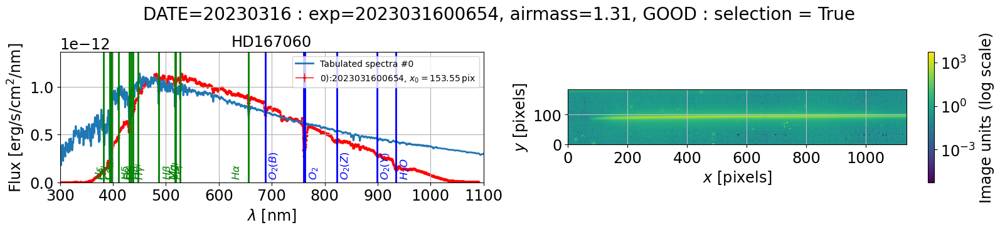

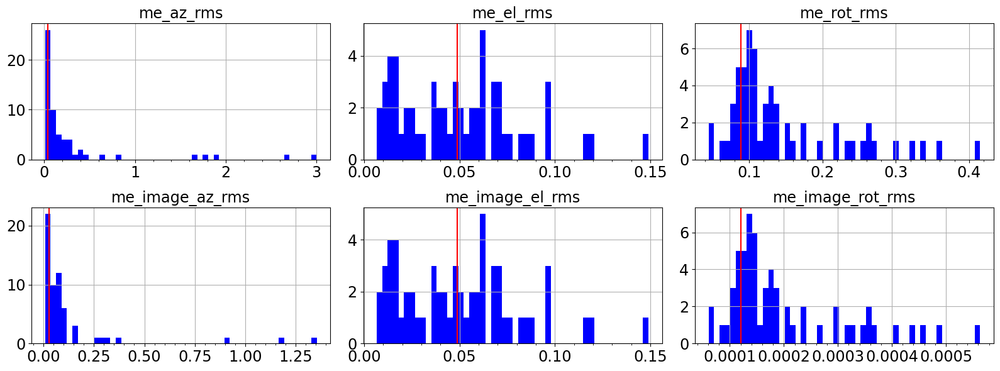

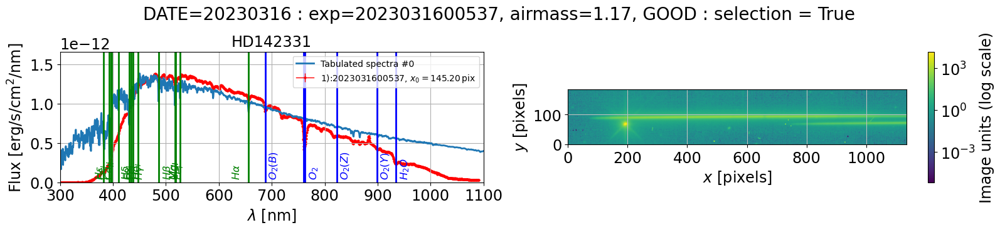

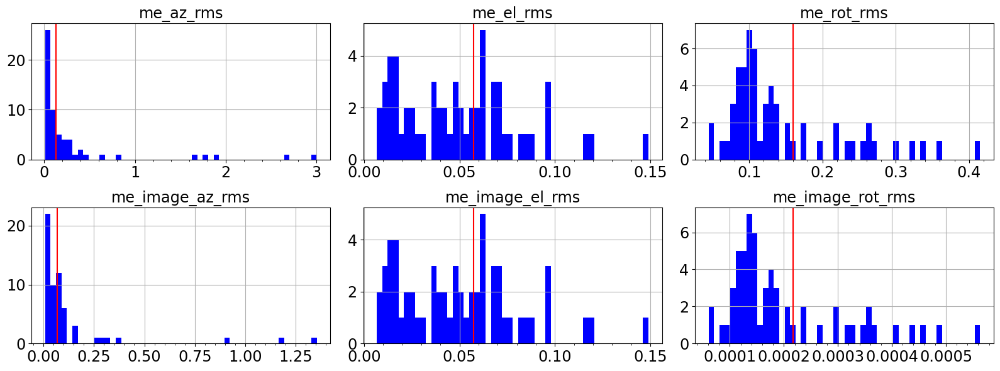

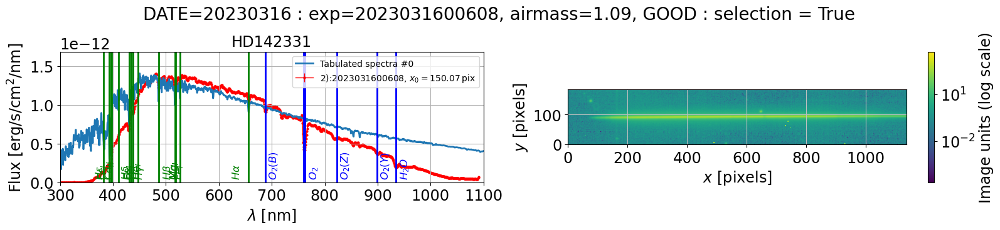

...

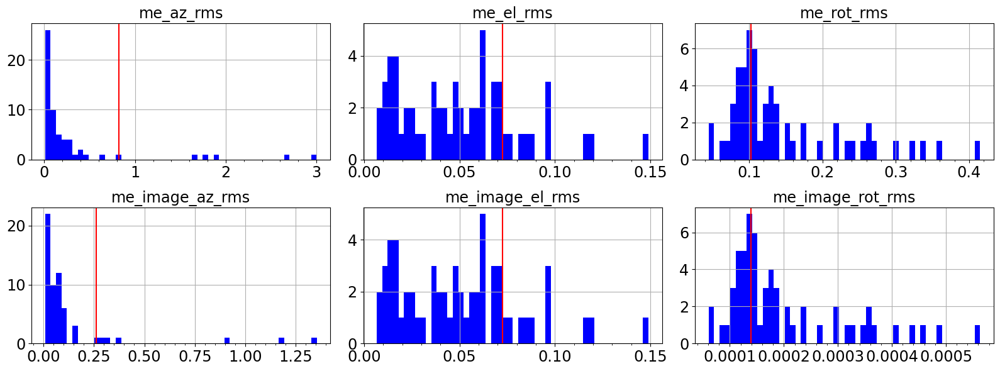

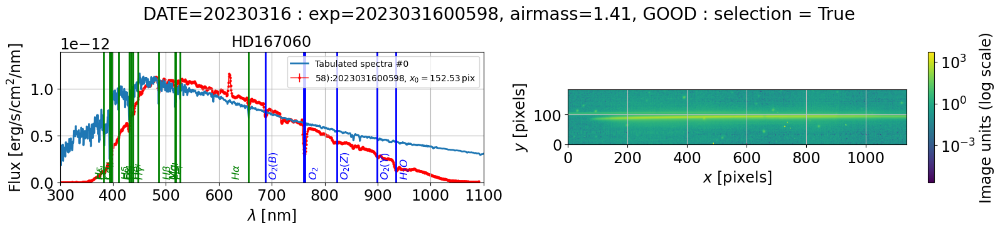

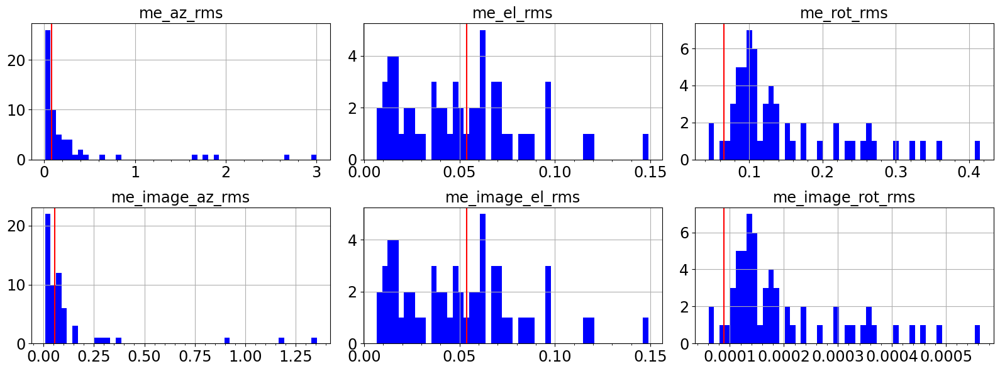

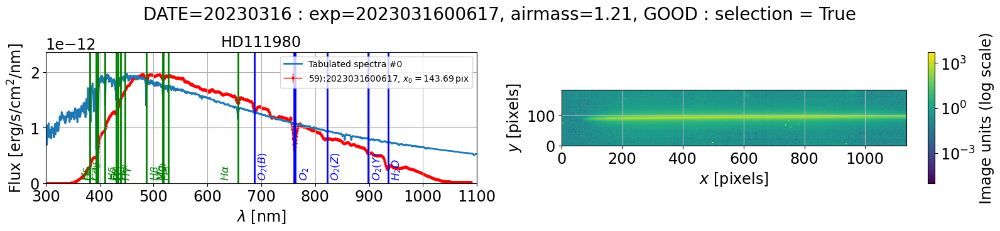

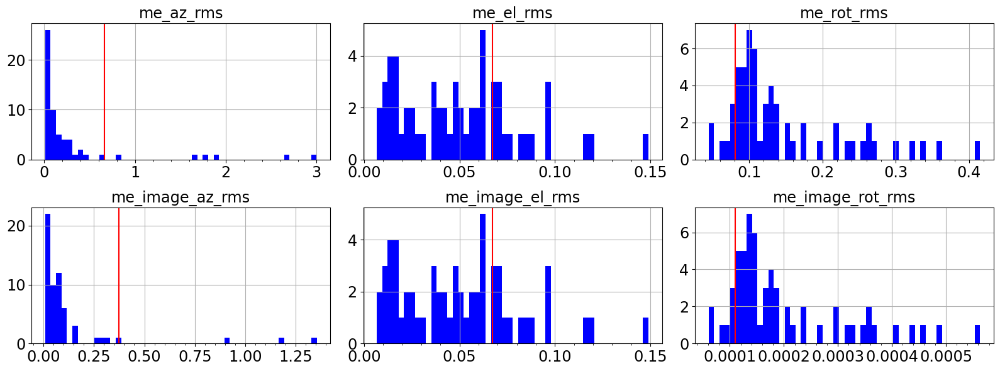

In [39]:
%matplotlib inline


infos = []
all_lambdas=[]
all_data=[]
all_data_err=[]


idx=0
for spec in all_spec:
    
    
    #s=spec.spectrum
    s=spec
    
    the_exposure = all_exposures[idx]
    
    label = str(idx) +"):" + str(all_exposures[idx])
    
    
    try:
        if not FLAG_MOUNT_ERRORS:
            
            
            # plot the standard spectrum
            fig=plt.figure(figsize=(16,6))
    
            ax1 = fig.add_subplot(2, 2, 1)
            s.plot_spectrum(ax=ax1,force_lines=True,label=label)
    
            ax2 = fig.add_subplot(2, 2, 2)
            s.plot_spectrogram(ax=ax2,scale="log")
    
            all_lambdas.append(s.lambdas)
            all_data.append(s.data)
            all_data_err.append(s.err)
        
            df_theexpo = df_summary[df_summary['exposure'] == the_exposure]
            airmass =  df_theexpo["spec_airmass"].values[0]
            
            
            flag_selection = df_theexpo[["spec_header_d2ccd","spec_header_targetx","spec_header_targety"]].apply(SelectionCriteria,axis=1).array[0]
            
        
            if not flag_selection:
                df_summary.loc[df_summary['exposure'] == the_exposure, ['selection']] = False
            
            if flag_selection:
                suptitle = f"DATE={DATE} : exp={the_exposure}, airmass={airmass:.2f}, GOOD : selection = {flag_selection}"
            else:
                suptitle = f"DATE={DATE} : exp={the_exposure}, airmass={airmass:.2f}, !!!<<<BAD>>>!!! : selection = {flag_selection}"
            
           
            plt.suptitle(suptitle,fontsize=20)
            plt.tight_layout()
            
            ################
            
            fig=plt.figure(figsize=(16,6))
            axes = fig.subplots(2,2)
            for i, ax in enumerate(axes.flat):    
                if i >=3:
                    break
                name = all_histnames[i]
                nbins=50
                values =  df_summary[name].values
                values0 =  df_theexpo[name].values
                ax.hist(values,bins=nbins,facecolor="blue")              
                ax.axvline(all_histminval[i],color="g")
                ax.axvline(all_histmaxval[i],color="g")
                ax.axvline(values0[0],color="r")
                ax.hist(values0,bins=nbins,facecolor="red")
                ax.set_title(name)
                ax.grid()
                ax.xaxis.set_minor_locator(tck.AutoMinorLocator())
                ax.axvline(values0[0],color="r")
            
            xpix=df_summary["spec_header_targetx"].values
            ypix=df_summary["spec_header_targety"].values
            xpix0=df_theexpo["spec_header_targetx"].values
            ypix0=df_theexpo["spec_header_targety"].values
            ax.scatter(xpix,ypix,color="blue",marker='+',s=25)
            ax.scatter(xpix0,ypix0,color="red",marker='o',s=35)
            ax.set_xlabel("targetx")
            ax.set_ylabel("targety")
            ax.xaxis.set_minor_locator(tck.AutoMinorLocator())
            ax.yaxis.set_minor_locator(tck.AutoMinorLocator())
            ax.grid()
            plt.tight_layout()
        
           
        else:
           
            # plot the standard spectrum
            fig=plt.figure(figsize=(16,6))
    
            ax1 = fig.add_subplot(2, 2, 1)
            s.plot_spectrum(ax=ax1,force_lines=True,label=label)
    
            ax2 = fig.add_subplot(2, 2, 2)
            s.plot_spectrogram(ax=ax2,scale="log")
    
            all_lambdas.append(s.lambdas)
            all_data.append(s.data)
            all_data_err.append(s.err)
        
            df_theexpo = df_summary[df_summary['exposure'] == the_exposure]
            airmass =  df_theexpo["spec_airmass"].values[0]
            
            flag_selection = df_theexpo[["spec_header_d2ccd","spec_header_targetx","spec_header_targety"]].apply(SelectionCriteria,axis=1).array[0]
            
        
            if not flag_selection:
                df_summary.loc[df_summary['exposure'] == the_exposure, ['selection']] = False
            
            if flag_selection:
                suptitle = f"DATE={DATE} : exp={the_exposure}, airmass={airmass:.2f}, GOOD : selection = {flag_selection}"
            else:
                suptitle = f"DATE={DATE} : exp={the_exposure}, airmass={airmass:.2f}, !!!<<<BAD>>>!!! : selection = {flag_selection}"
            
            
            plt.suptitle(suptitle,fontsize=20)
            plt.tight_layout()
            
            #####
            
            fig=plt.figure(figsize=(16,6))
            axes = fig.subplots(2,3)
            for i, ax in enumerate(axes.flat):    
                name = all_histnames2[i]
                nbins=50
                values =  df_summary[name].values
                values0 =  df_theexpo[name].values
                ax.hist(values,bins=nbins,facecolor="blue")
                ax.set_title(name)
                ax.grid()
                ax.xaxis.set_minor_locator(tck.AutoMinorLocator())
                ax.axvline(values0[0],color="r")
            plt.tight_layout()
            plt.show()
    
            
    except Exception as inst:
        print(" >>> Exception catched for "+ label )
        print(type(inst))    # the exception instance
        print(inst.args)     # arguments stored in .args

    
    idx+=1

In [38]:
df_summary[['exposure','spec_header_chi2_fit','spec_header_d2ccd','spec_header_pixshift']].sort_values(by="exposure")

,exposure,spec_header_chi2_fit,spec_header_d2ccd,spec_header_pixshift
0,2023031600465,20.028355,187.313525,9.122968e-02
1,2023031600466,12.354948,187.466963,-7.873038e-02
2,2023031600473,130.478204,187.621795,-9.042613e-01
3,2023031600474,154.193880,187.593677,-9.358697e-01
4,2023031600488,13.432725,187.396361,-1.085606e-03
5,2023031600489,11.072264,187.438158,2.914680e-02
6,2023031600497,26.349361,186.393842,-1.000000e+00
7,2023031600498,93.662100,184.665636,-1.000994e+00
8,2023031600505,12.741928,187.332328,5.759539e-02
9,2023031600506,14.444760,187.439709,-3.096965e-04
